In [1]:
%matplotlib inline
import os
import time
import glob
import cv2
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from sklearn import svm
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from skimage.feature import hog
from scipy.ndimage.measurements import label
from prettytable import PrettyTable
from moviepy.editor import VideoFileClip
from IPython.display import HTML

## 1. EDA

In [2]:
cars = glob.glob("./data/vehicles/*/*.png")
noncars = glob.glob("./data/non-vehicles/*/*.png")

# Print number of dataset
print("Number of Cars: {} \t Number of Non-Cars: {} \t Total: {}".format(len(cars), len(noncars), len(cars)+len(noncars)))

Number of Cars: 8792 	 Number of Non-Cars: 8968 	 Total: 17760


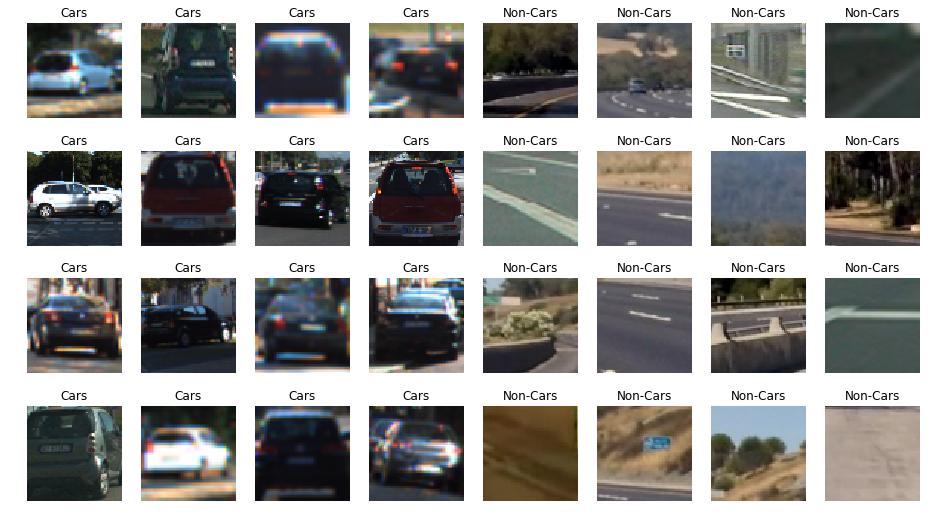

In [3]:
# Figure examples of each
fig = plt.figure(figsize=(16,9))
for i in range(0, 16):
    rand_cars = np.random.randint(0, len(cars))
    rand_noncars = np.random.randint(0, len(noncars))
    p = np.int16(np.trunc(i/4))
    axs1 = fig.add_subplot(4, 8, 4*p+i+1)
    axs2 = fig.add_subplot(4, 8, 4*p+i+5)
    axs1.set_title("Cars")
    axs2.set_title("Non-Cars")
    axs1.axis("off")
    axs2.axis("off")
    axs1.imshow(mpimg.imread(cars[rand_cars]))
    axs2.imshow(mpimg.imread(noncars[rand_noncars]))
plt.show()

## 2. Extract HOG Features

In [4]:
def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    if vis == True:
        features, hog_image = hog(img, orientations=orient,
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block),
                                  transform_sqrt=False,
                                  visualise=vis,
                                  feature_vector=feature_vec)
        return features, hog_image
    else:
        features = hog(img, orientations=orient,
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block),
                       transform_sqrt=False,
                       visualise=vis,
                       feature_vector=feature_vec)
        return features

In [5]:
def extract_features(imgs, cspace="RGB", orient=9, pix_per_cell=8, cell_per_block=2, hog_channel=0):
    features = []
    for img in imgs:
        image = mpimg.imread(img)
        # Depends on ColorSpace
        if cspace != "RGB":
            if cspace == "HSV":
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif cspace == "LUV":
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif cspace == "HLS":
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif cspace == "YUV":
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif cspace == "YCrCb":
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else:
            feature_image = np.copy(image)
        
        # Channel of ColorSpace: 0, 1, 2, and ALL
        if hog_channel == "ALL":
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.append(get_hog_features(feature_image[:,:,channel], orient, pix_per_cell, cell_per_block))
            hog_features = np.ravel(hog_features)
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, pix_per_cell, cell_per_block)
        features.append(hog_features)
    return features

In [6]:
def run_hog(cspace, orient, pix_per_cell, cell_per_block, hog_channel):
    """
    This function makes LinearSVC result based on argument features.
    """
    start1 = time.time()
    cars_features = extract_features(cars, cspace=cspace, orient=orient, pix_per_cell=pix_per_cell,
                                     cell_per_block=cell_per_block, hog_channel=hog_channel)
    noncars_features = extract_features(noncars, cspace=cspace, orient=orient, pix_per_cell=pix_per_cell,
                                        cell_per_block=cell_per_block, hog_channel=hog_channel)
    end1 = time.time()
    time1 = round(end1 - start1, 2)
    
    X = np.vstack((cars_features, noncars_features)).astype(np.float64)
    # Normalized
    X_scaler = StandardScaler().fit(X)
    scaled_X = X_scaler.transform(X)
    
    y = np.hstack((np.ones(len(cars_features)), np.zeros(len(noncars_features))))
    
    # Split train and test randomly, but set equal value of random_state for fairness
    X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.25, random_state=777)
    
    svc = svm.LinearSVC()
    start2 = time.time()
    svc.fit(X_train, y_train)
    score = svc.score(X_test, y_test)
    
    end2 = time.time()
    time2 = round(end2 - start2, 2)
    return svc, score, time1, time2
    

In [7]:
# Possible options
cspace = ["RGB", "YUV", "LUV", "HLS", "YUV", "YCrCb"]
orient = [7, 9, 11]
pix_per_cell = [8, 16]
cell_per_block = 2
hog_channel = [0, 1, 2, "ALL"]

In [8]:
# Run all combinations above and Find best Accuracy score
count  = 0
pt = PrettyTable()
pt.field_names = ["Steps", "ColorSpace", "Orient", "Pixels Per Cell", "Cells Per Block", "HOG Channel", "Time1", "Score", "Time2"]
total_len = len(cspace)*len(orient)*len(pix_per_cell)*len(hog_channel)
best_score = 0

s_time = time.time()
for c in cspace:
    for o in orient:
        for ppc in pix_per_cell:
            for hc in hog_channel:
                count += 1
                _, score, t1, t2 = run_hog(c, o, ppc, cell_per_block, hc)
                result = [count, c, o, ppc, cell_per_block, hc, t1, round(score*100, 3), t2]
                pt.add_row(result)

                if best_score < score:
                    best_score = score
                    best_result = result

                print("{}/{} Done. \t Best: {:.3f} \t {:.2f}min".format(count, total_len, best_score*100, (time.time()-s_time)/60))

pt.add_row(best_result)
pt.align = "r"
print(pt)

1/144 Done. 	 Best: 93.468 	 0.62min
2/144 Done. 	 Best: 94.685 	 1.41min
3/144 Done. 	 Best: 94.685 	 2.23min
4/144 Done. 	 Best: 96.419 	 3.98min
5/144 Done. 	 Best: 96.419 	 4.44min
6/144 Done. 	 Best: 96.419 	 4.89min
7/144 Done. 	 Best: 96.419 	 5.34min
8/144 Done. 	 Best: 96.419 	 6.16min
9/144 Done. 	 Best: 96.419 	 6.78min
10/144 Done. 	 Best: 96.419 	 7.56min
11/144 Done. 	 Best: 96.419 	 8.37min
12/144 Done. 	 Best: 96.509 	 10.50min
13/144 Done. 	 Best: 96.509 	 11.12min
14/144 Done. 	 Best: 96.509 	 11.71min
15/144 Done. 	 Best: 96.509 	 12.29min
16/144 Done. 	 Best: 96.509 	 13.45min
17/144 Done. 	 Best: 96.509 	 14.09min
18/144 Done. 	 Best: 96.509 	 14.70min
19/144 Done. 	 Best: 96.509 	 15.32min
20/144 Done. 	 Best: 96.914 	 16.92min
21/144 Done. 	 Best: 96.914 	 17.38min
22/144 Done. 	 Best: 96.914 	 17.82min
23/144 Done. 	 Best: 96.914 	 18.26min
24/144 Done. 	 Best: 96.914 	 19.11min
25/144 Done. 	 Best: 96.914 	 19.80min
26/144 Done. 	 Best: 96.914 	 20.66min
27/144

+-------+------------+--------+-----------------+-----------------+-------------+--------+--------+-------+


## 3. Highest Accuracy

In [9]:
# Values for best accuracy
cspace = "YCrCb"
orient = 11
pix_per_cell = 8
cell_per_block = 2
hog_channel = "ALL"

svc, _, _, _ = run_hog(cspace, orient, pix_per_cell, cell_per_block, hog_channel)

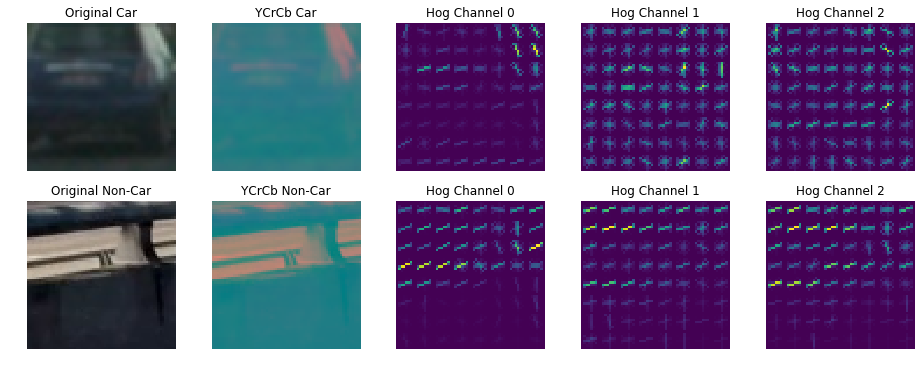

In [10]:
# Visualize original, YCrCb, and each HOG channel
cars_RGB = mpimg.imread(cars[np.random.randint(0, len(cars))])
noncars_RGB = mpimg.imread(noncars[np.random.randint(0, len(noncars))])
cars_YCrCb = cv2.cvtColor(cars_RGB, cv2.COLOR_RGB2YCrCb)
noncars_YCrCb = cv2.cvtColor(noncars_RGB, cv2.COLOR_RGB2YCrCb)
_, cars_hog0 = get_hog_features(cars_YCrCb[:,:,0], orient, pix_per_cell, cell_per_block, vis=True)
_, noncars_hog0 = get_hog_features(noncars_YCrCb[:,:,0], orient, pix_per_cell, cell_per_block, vis=True)
_, cars_hog1 = get_hog_features(cars_YCrCb[:,:,1], orient, pix_per_cell, cell_per_block, vis=True)
_, noncars_hog1 = get_hog_features(noncars_YCrCb[:,:,1], orient, pix_per_cell, cell_per_block, vis=True)
_, cars_hog2 = get_hog_features(cars_YCrCb[:,:,2], orient, pix_per_cell, cell_per_block, vis=True)
_, noncars_hog2 = get_hog_features(noncars_YCrCb[:,:,2], orient, pix_per_cell, cell_per_block, vis=True)

fig = plt.figure(figsize=(16,6))
axs1 = fig.add_subplot(2, 5, 1)
axs1.set_title("Original Car")
axs1.axis("off")
axs1.imshow(cars_RGB)

axs2 = fig.add_subplot(2, 5, 2)
axs2.set_title("YCrCb Car")
axs2.axis("off")
axs2.imshow(cars_YCrCb)

axs3 = fig.add_subplot(2, 5, 3)
axs3.set_title("Hog Channel 0")
axs3.axis("off")
axs3.imshow(cars_hog0)

axs4 = fig.add_subplot(2, 5, 4)
axs4.set_title("Hog Channel 1")
axs4.axis("off")
axs4.imshow(cars_hog1)

axs5 = fig.add_subplot(2, 5, 5)
axs5.set_title("Hog Channel 2")
axs5.axis("off")
axs5.imshow(cars_hog2)

axs6 = fig.add_subplot(2, 5, 6)
axs6.set_title("Original Non-Car")
axs6.axis("off")
axs6.imshow(noncars_RGB)

axs7 = fig.add_subplot(2, 5, 7)
axs7.set_title("YCrCb Non-Car")
axs7.axis("off")
axs7.imshow(noncars_YCrCb)

axs8 = fig.add_subplot(2, 5, 8)
axs8.set_title("Hog Channel 0")
axs8.axis("off")
axs8.imshow(noncars_hog0)

axs9 = fig.add_subplot(2, 5, 9)
axs9.set_title("Hog Channel 1")
axs9.axis("off")
axs9.imshow(noncars_hog1)

axs10 = fig.add_subplot(2, 5, 10)
axs10.set_title("Hog Channel 2")
axs10.axis("off")
axs10.imshow(noncars_hog2)

plt.show()

## 4. Find Cars in an Image

In [11]:
def find_cars(img, start, stop, scale, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block):
    """
    This function can extract features on a image.
    """
    img = img.astype(np.float32)/255
    img_subsample = img[start:stop,:,:]

    # ColorSpace
    if cspace != 'RGB':
        if cspace == 'HSV':
            image = cv2.cvtColor(img_subsample, cv2.COLOR_RGB2HSV)
        elif cspace == 'LUV':
            image = cv2.cvtColor(img_subsample, cv2.COLOR_RGB2LUV)
        elif cspace == 'HLS':
            image = cv2.cvtColor(img_subsample, cv2.COLOR_RGB2HLS)
        elif cspace == 'YUV':
            image = cv2.cvtColor(img_subsample, cv2.COLOR_RGB2YUV)
        elif cspace == 'YCrCb':
            image = cv2.cvtColor(img_subsample, cv2.COLOR_RGB2YCrCb)
    else:
        image = np.copy(image_subsample)   
    
    # Rescale image
    if scale != 1:
        img_shape = image.shape
        image = cv2.resize(image, (np.int(img_shape[1]/scale), np.int(img_shape[0]/scale)))
    
    if hog_channel == 'ALL':
        ch0 = image[:,:,0]
        ch1 = image[:,:,1]
        ch2 = image[:,:,2]
    else: 
        ch0 = image[:,:,hog_channel]

    # How many blocks
    num_x_blocks = (ch0.shape[1] // pix_per_cell) + 1
    num_y_blocks = (ch0.shape[0] // pix_per_cell) + 1
    num_feat_per_block = orient * cell_per_block ** 2
    
    window = 64
    num_blocks_per_window = (window // pix_per_cell) - 1 
    cells_per_step = 2
    num_x_steps = (num_x_blocks - num_blocks_per_window) // cells_per_step
    num_y_steps = (num_y_blocks - num_blocks_per_window) // cells_per_step
    
    # HOG features by each channel
    hog0 = get_hog_features(ch0, orient, pix_per_cell, cell_per_block, feature_vec=False)   
    if hog_channel == 'ALL':
        hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
        hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    # Find features and save rectangles
    rectangles = []
    for ii in range(num_x_steps):
        for jj in range(num_y_steps):
            x = ii * cells_per_step
            y = jj * cells_per_step
            
            hog_feature0 = hog0[y:y+num_blocks_per_window, x:x+num_blocks_per_window].ravel()
            if hog_channel == 'ALL':
                hog_feature1 = hog1[y:y+num_blocks_per_window, x:x+num_blocks_per_window].ravel() 
                hog_feature2 = hog2[y:y+num_blocks_per_window, x:x+num_blocks_per_window].ravel() 
                hog_features = np.hstack((hog_feature0, hog_feature1, hog_feature2))
            else:
                hog_features = hog_featrue0

            x_left = x * pix_per_cell
            y_top = y * pix_per_cell
            
            prediction = svc.predict(hog_features)
            
            if prediction == 1:
                x_box = np.int(x_left * scale)
                y_box = np.int(y_top * scale)
                rect = np.int(window * scale)
                rectangles.append(((x_box, y_box+start),(x_box+rect, y_box+rect+start)))
                
    return rectangles

In [12]:
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=3):
    image = np.copy(img)
    for bbox in bboxes:
        cv2.rectangle(image, bbox[0], bbox[1], color, thick)
    return image

## 4-1. Simple Rectangles

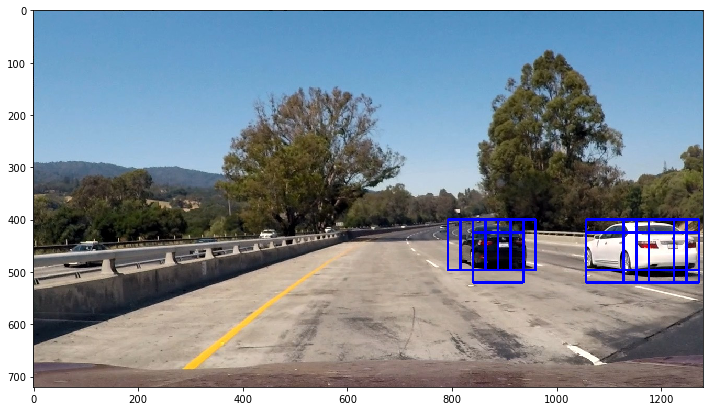

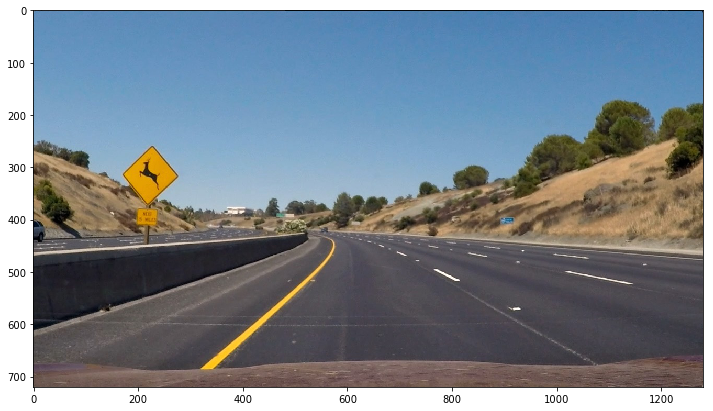

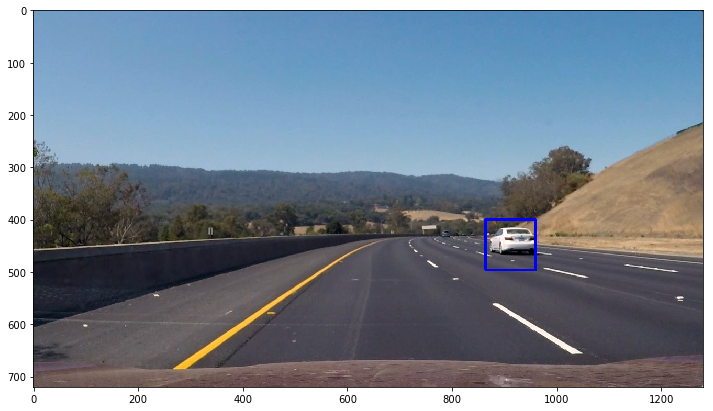

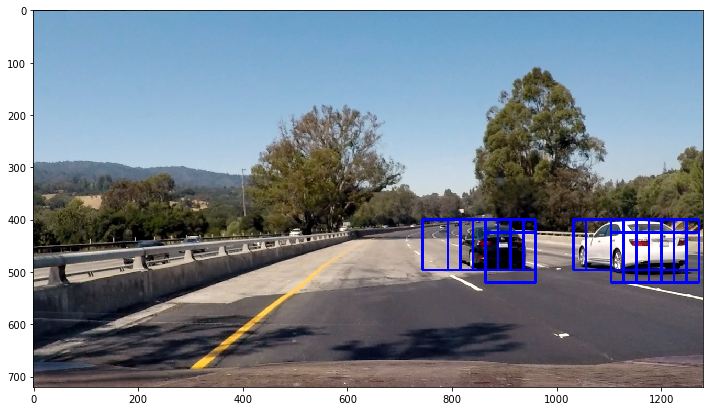

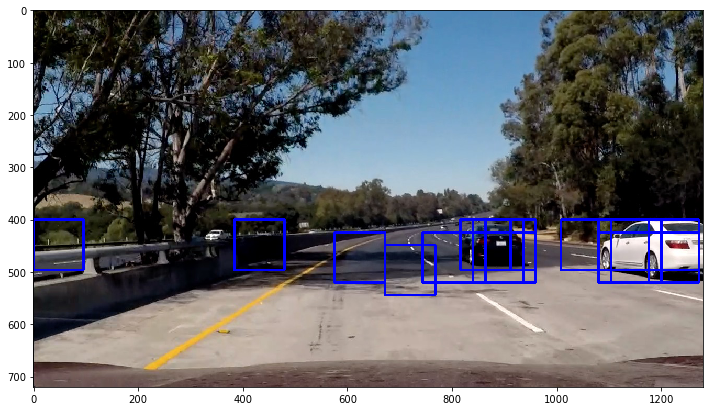

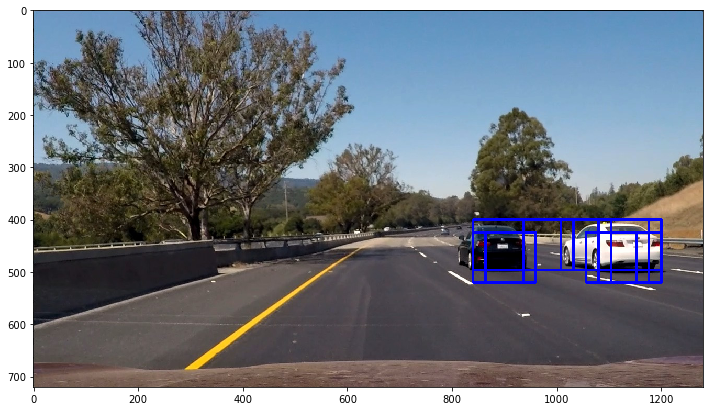

In [13]:
test_imgs = glob.glob('./test_images/*.jpg')

start = 400
stop = 656
scale = 1.5
cspace = "YCrCb"
orient = 11
pix_per_cell = 8
cell_per_block = 2
hog_channel = "ALL"

for test_img in test_imgs:
    img = mpimg.imread(test_img)
    rectangles = find_cars(img, start, stop, scale, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block)
    result = draw_boxes(img, rectangles)
    plt.figure(figsize=(12, 8))
    plt.imshow(result)
    plt.show()

## 4-2. Multiple Size Rectangles

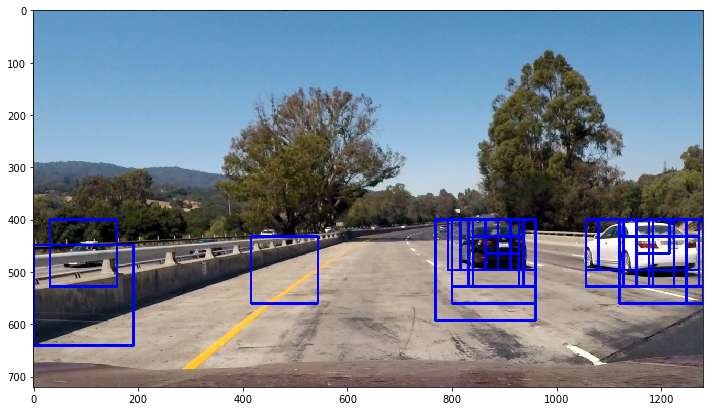

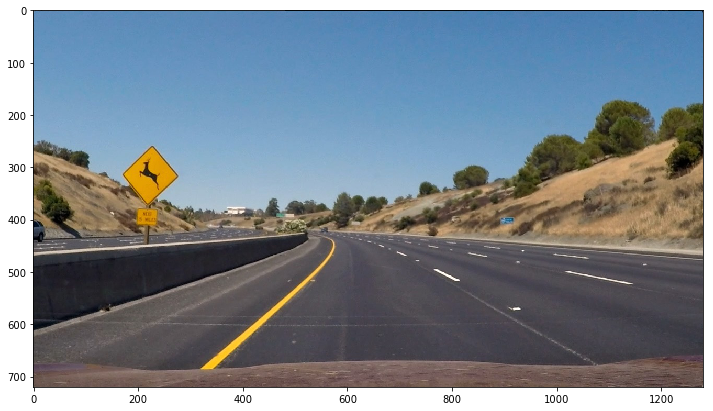

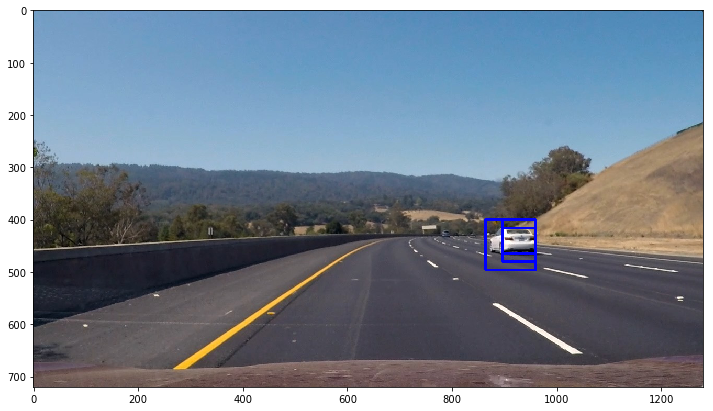

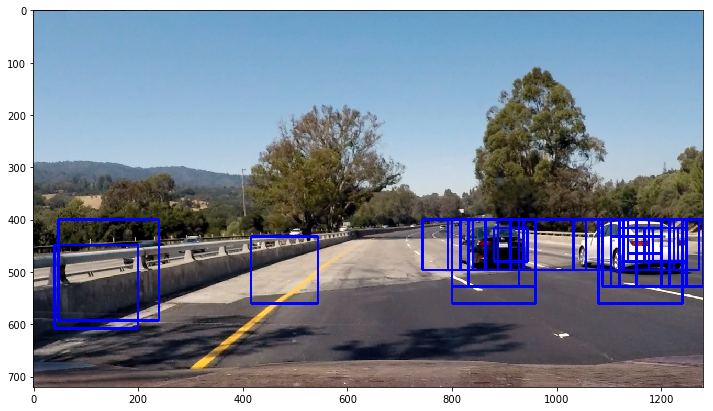

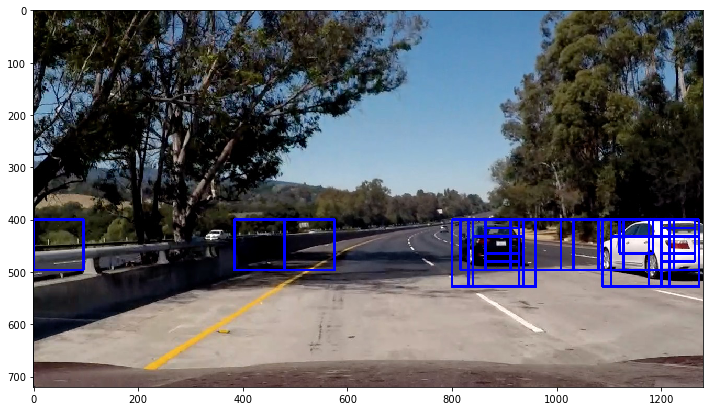

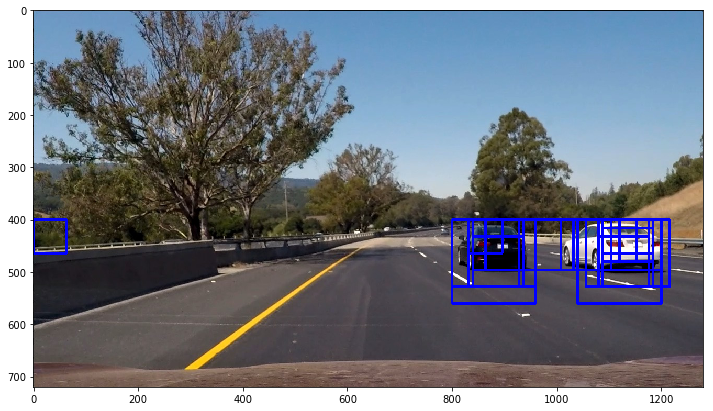

In [14]:
for test_img in test_imgs:
    img = mpimg.imread(test_img)
    
    rectangles = []
    rectangles.append(find_cars(img, 400, 464, 1.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 416, 480, 1.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 400, 496, 1.5, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 432, 528, 1.5, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 400, 528, 2.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 432, 560, 2.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 400, 560, 2.5, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 448, 608, 2.5, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 400, 592, 3.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 448, 640, 3.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles = [item for rectangle in rectangles for item in rectangle]
    
    result = draw_boxes(img, rectangles)
    plt.figure(figsize=(12, 8))
    plt.imshow(result)
    plt.show()

## 5. Heatmaps

In [15]:
def draw_heatmap(heatmap, bbox_list):
    for box in bbox_list:
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1
    return heatmap

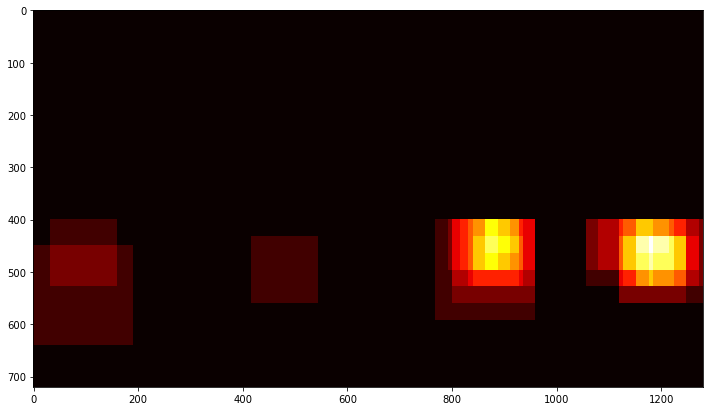

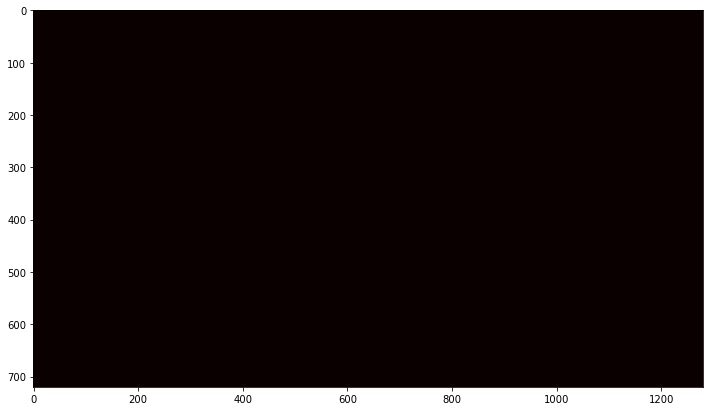

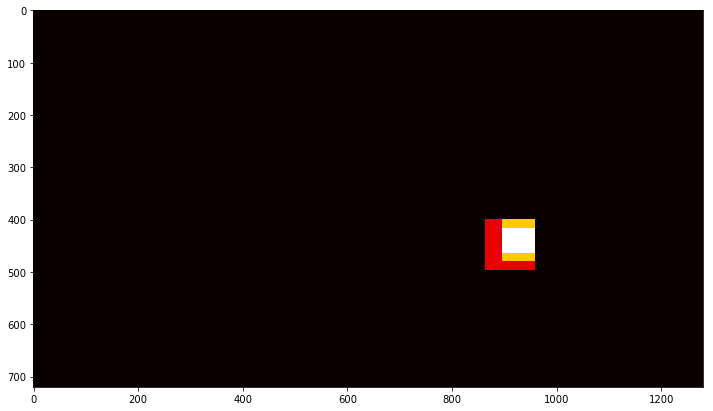

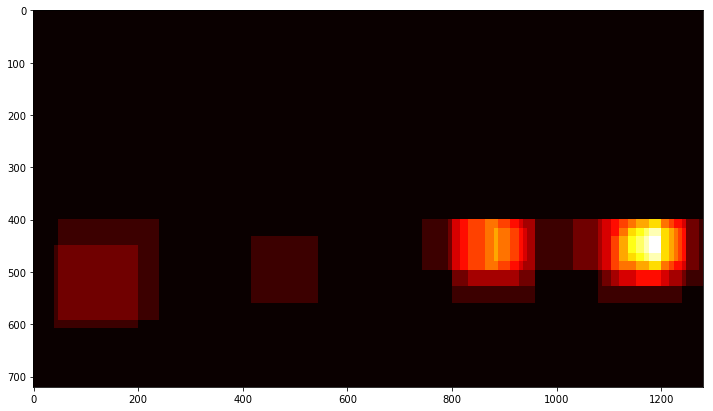

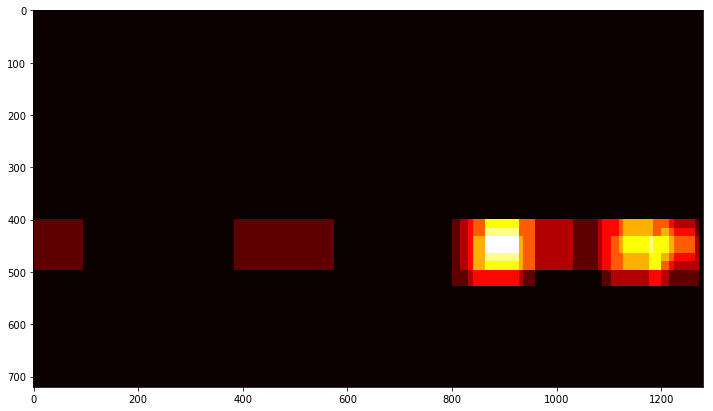

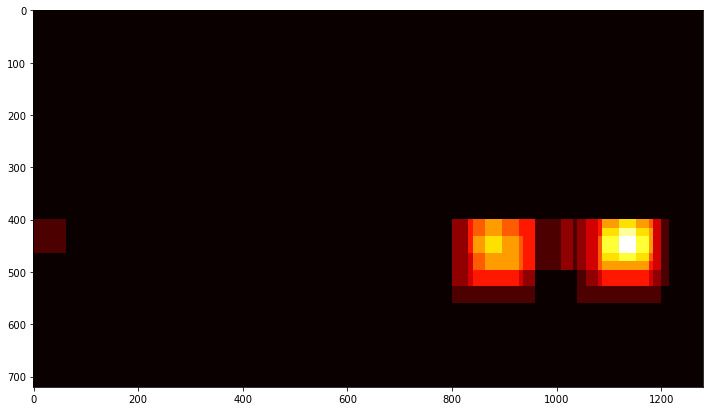

In [16]:
for test_img in test_imgs:
    img = mpimg.imread(test_img)
    
    rectangles = []
    rectangles.append(find_cars(img, 400, 464, 1.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 416, 480, 1.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 400, 496, 1.5, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 432, 528, 1.5, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 400, 528, 2.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 432, 560, 2.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 400, 560, 2.5, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 448, 608, 2.5, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 400, 592, 3.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 448, 640, 3.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles = [item for rectangle in rectangles for item in rectangle]
    
    img_heatmap = np.zeros_like(img[:,:,0])
    img_heatmap = draw_heatmap(img_heatmap, rectangles)
    plt.figure(figsize=(12, 8))
    plt.imshow(img_heatmap, cmap="hot")
    plt.show()

## 5-1. Heatmaps with Threshold

In [17]:
def apply_threshold(heatmap, threshold=1):
    heatmap[heatmap <= threshold] = 0
    return heatmap

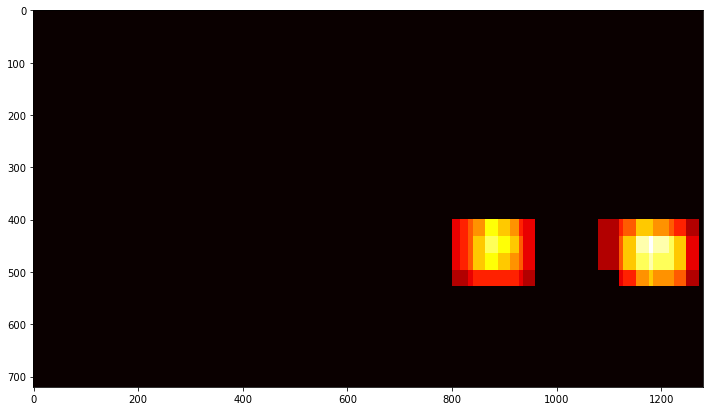

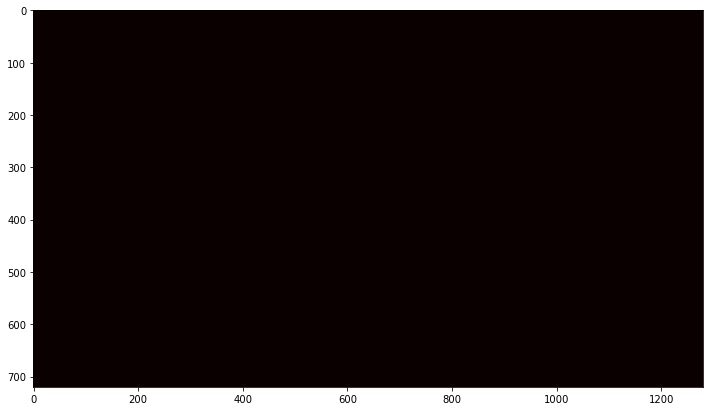

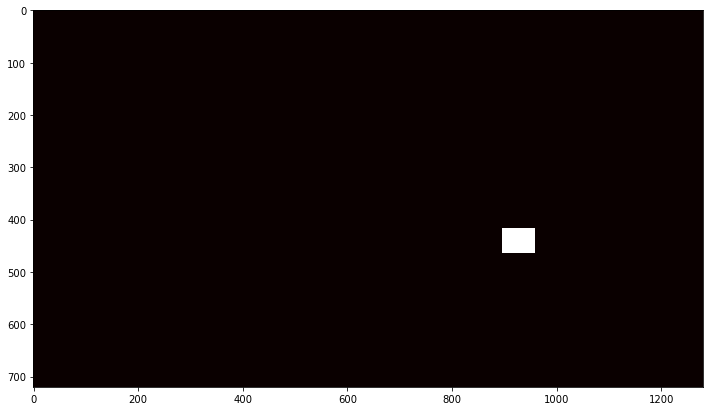

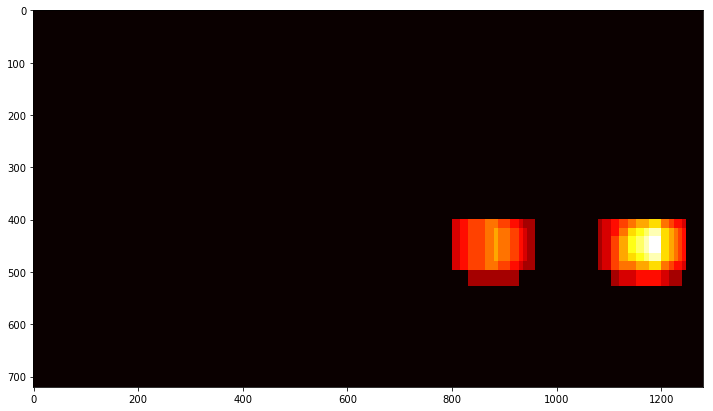

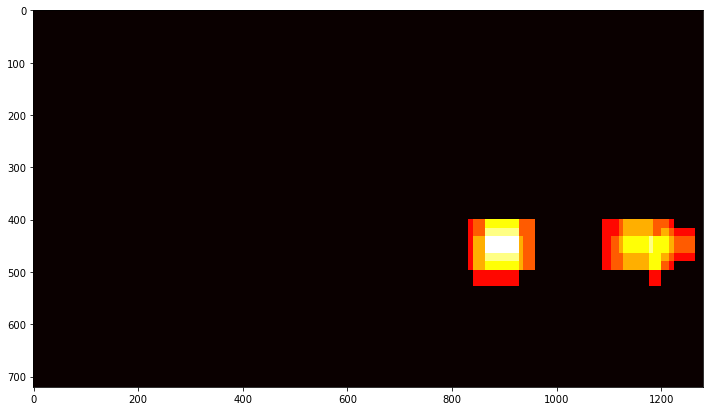

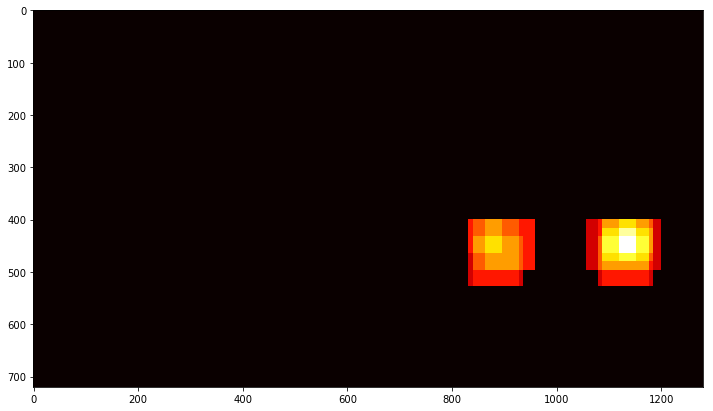

In [18]:
for test_img in test_imgs:
    img = mpimg.imread(test_img)
    
    rectangles = []
    rectangles.append(find_cars(img, 400, 464, 1.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 416, 480, 1.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 400, 496, 1.5, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 432, 528, 1.5, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 400, 528, 2.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 432, 560, 2.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 400, 560, 2.5, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 448, 608, 2.5, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 400, 592, 3.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 448, 640, 3.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles = [item for rectangle in rectangles for item in rectangle]
    
    img_heatmap = np.zeros_like(img[:,:,0])
    img_heatmap = draw_heatmap(img_heatmap, rectangles)
    img_heatmap = apply_threshold(img_heatmap, 2)
    plt.figure(figsize=(12, 8))
    plt.imshow(img_heatmap, cmap="hot")
    plt.show()

## 6. Lables in SciPy

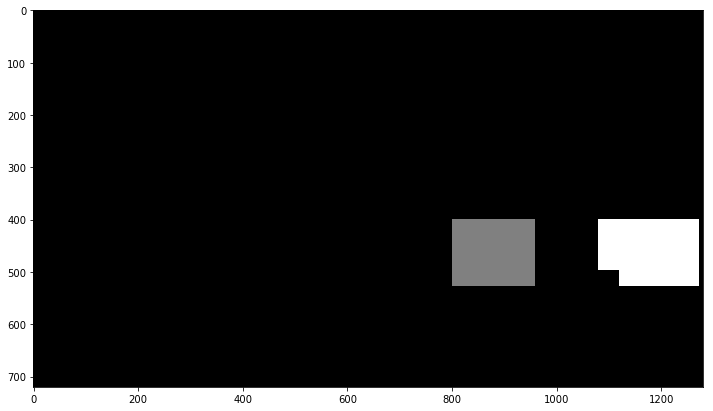

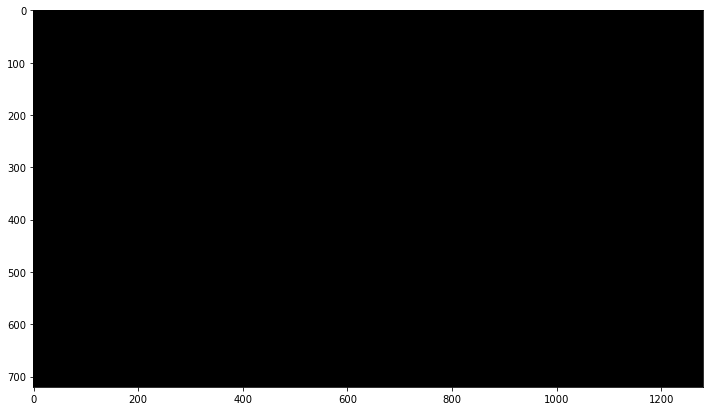

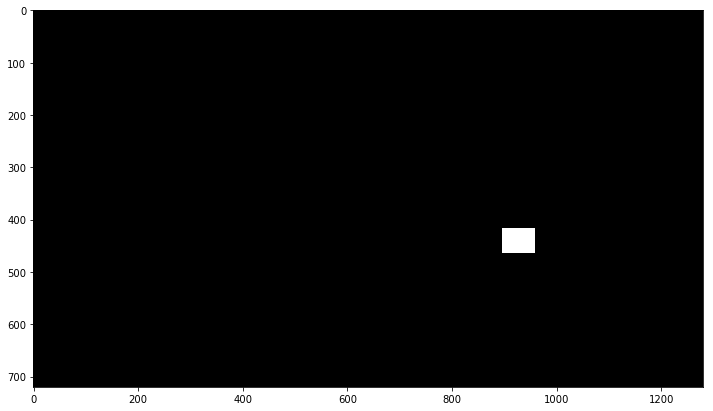

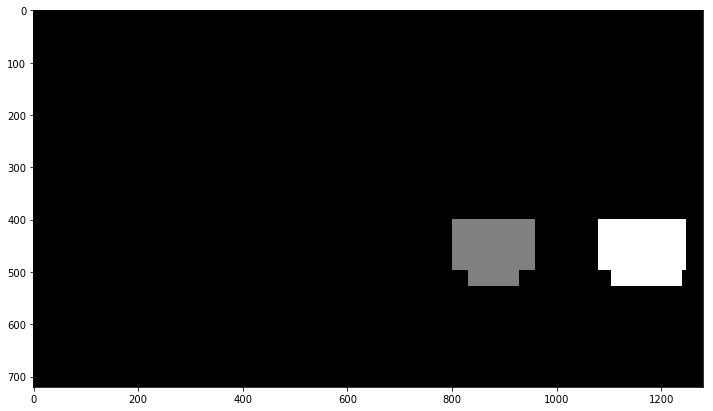

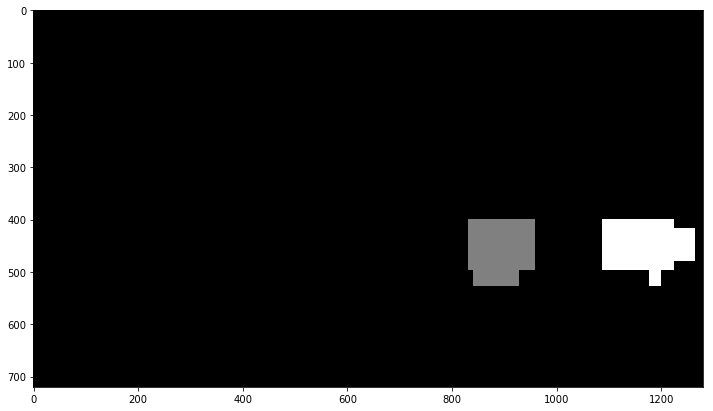

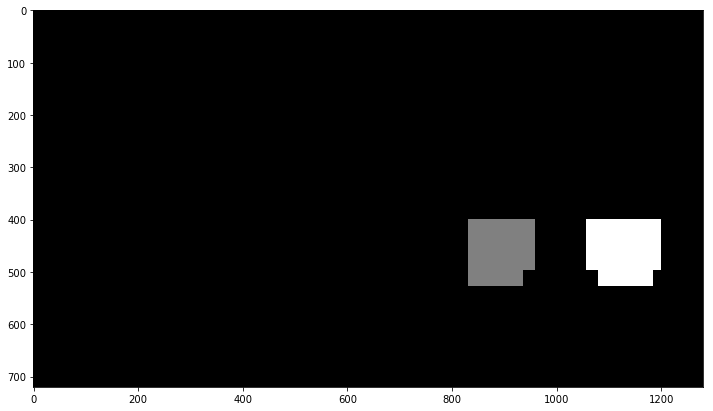

In [19]:
for test_img in test_imgs:
    img = mpimg.imread(test_img)
    
    rectangles = []
    rectangles.append(find_cars(img, 400, 464, 1.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 416, 480, 1.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 400, 496, 1.5, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 432, 528, 1.5, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 400, 528, 2.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 432, 560, 2.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 400, 560, 2.5, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 448, 608, 2.5, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 400, 592, 3.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 448, 640, 3.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles = [item for rectangle in rectangles for item in rectangle]
    
    img_heatmap = np.zeros_like(img[:,:,0])
    img_heatmap = draw_heatmap(img_heatmap, rectangles)
    img_heatmap = apply_threshold(img_heatmap, 2)
    
    labels = label(img_heatmap)
    
    plt.figure(figsize=(12, 8))
    plt.imshow(labels[0], cmap="gray")
    plt.show()

## 7. Draw Boxes with Original Image

In [20]:
def draw_label_bboxes(img, labels, thick=3):
    rects = []
    for car_number in range(1, labels[1]+1):
        nonzero = (labels[0] == car_number).nonzero()
        
        x = np.array(nonzero[1])
        y = np.array(nonzero[0])
        
        # Min and Max by x, y
        bbox = ((np.min(x), np.min(y)), (np.max(x), np.max(y)))
        rects.append(bbox)

        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), thick)
    return img, rects

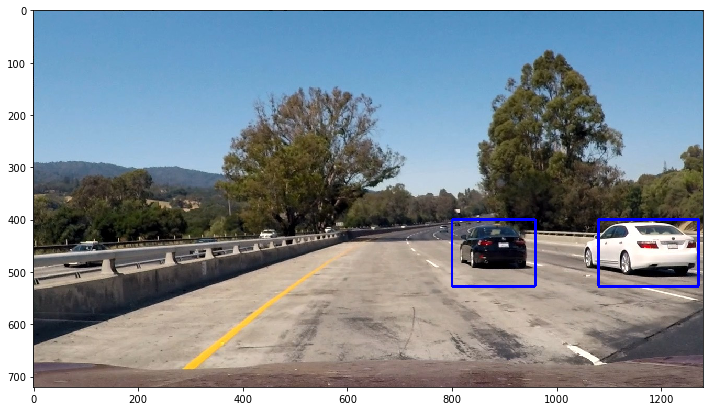

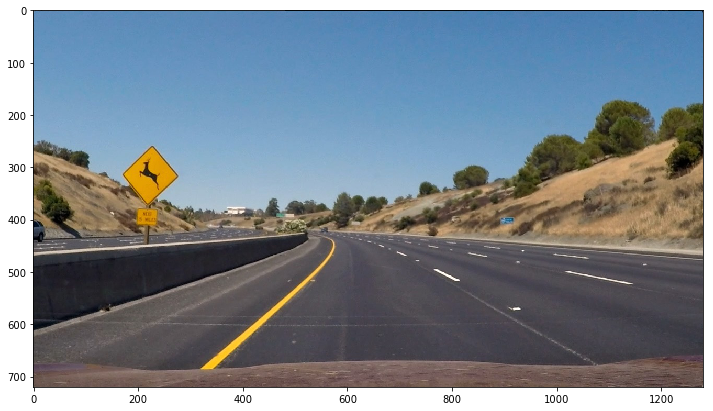

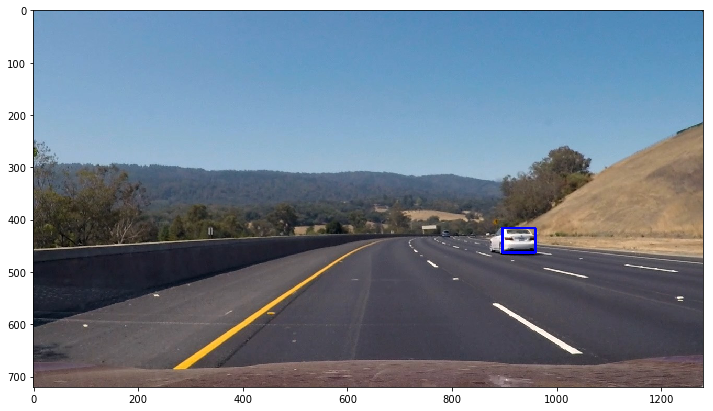

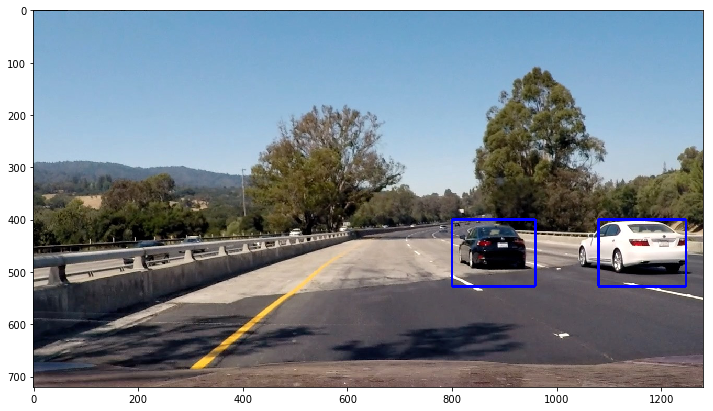

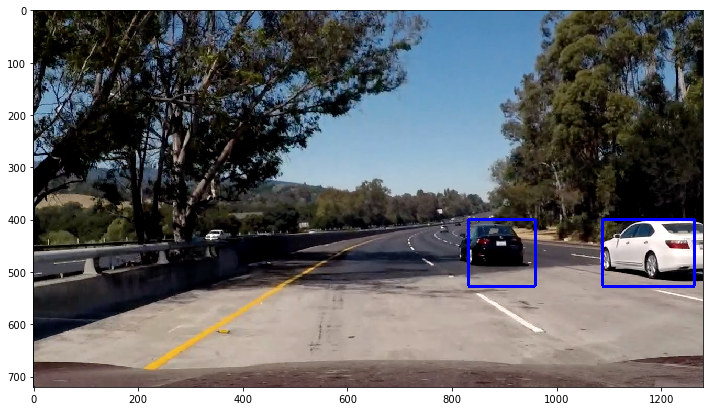

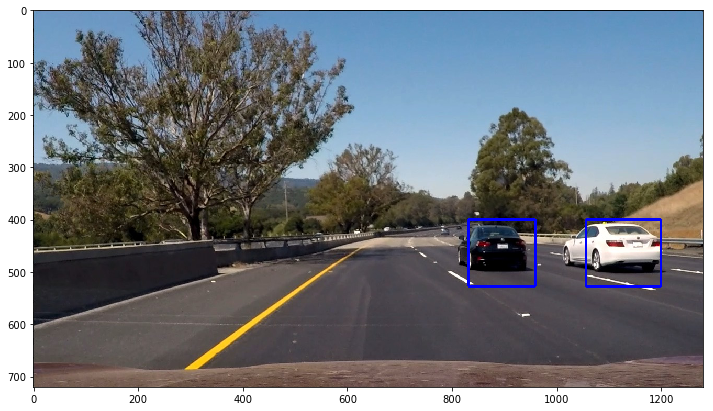

In [21]:
for test_img in test_imgs:
    img = mpimg.imread(test_img)
    
    rectangles = []
    rectangles.append(find_cars(img, 400, 464, 1.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 416, 480, 1.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 400, 496, 1.5, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 432, 528, 1.5, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 400, 528, 2.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 432, 560, 2.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 400, 560, 2.5, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 448, 608, 2.5, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 400, 592, 3.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 448, 640, 3.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles = [item for rectangle in rectangles for item in rectangle]
    
    img_heatmap = np.zeros_like(img[:,:,0])
    img_heatmap = draw_heatmap(img_heatmap, rectangles)
    img_heatmap = apply_threshold(img_heatmap, 2)
    
    labels = label(img_heatmap)
    
    result = np.copy(img)
    draws, rects = draw_label_bboxes(result, labels, 3)
    
    plt.figure(figsize=(12, 8))
    plt.imshow(draws)
    plt.show()

## 8. Apply Video

In [22]:
def process(img):
    rectangles = []
    rectangles.append(find_cars(img, 400, 464, 1.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 416, 480, 1.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 400, 496, 1.5, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 432, 528, 1.5, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 400, 528, 2.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 432, 560, 2.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 400, 560, 2.5, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 448, 608, 2.5, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 400, 592, 3.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles.append(find_cars(img, 448, 640, 3.0, cspace, hog_channel, svc, orient, pix_per_cell, cell_per_block))
    rectangles = [item for rectangle in rectangles for item in rectangle]
    
    img_heatmap = np.zeros_like(img[:,:,0])
    img_heatmap = draw_heatmap(img_heatmap, rectangles)
    img_heatmap = apply_threshold(img_heatmap, 2)
    
    labels = label(img_heatmap)
    
    result = np.copy(img)
    draws, rects = draw_label_bboxes(result, labels, 3)
    return draws

In [23]:
test_result = "test_video_result.mp4"
clip1 = VideoFileClip("test_video.mp4")
test_clip = clip1.fl_image(process)
%time test_clip.write_videofile(test_result, audio=False)

[MoviePy] >>>> Building video test_video_result.mp4
[MoviePy] Writing video test_video_result.mp4


 97%|███████████████████████████████████████████████████████████████████████████████▉  | 38/39 [00:21<00:00,  1.72it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_result.mp4 

Wall time: 22.7 s


In [24]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format("test_video_result.mp4"))

In [25]:
project_result = "project_video_result.mp4"
clip2 = VideoFileClip("project_video.mp4")
project_clip = clip2.fl_image(process)
%time project_clip.write_videofile(project_result, audio=False)

[MoviePy] >>>> Building video project_video_result.mp4
[MoviePy] Writing video project_video_result.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [12:21<00:00,  1.70it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_result.mp4 

Wall time: 12min 22s


In [26]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format("project_video_result.mp4"))